In [1]:
import matplotlib.pyplot as plt
import scipy.io as sio
import skimage.io
import numpy as np
import h5py
import sys
import gc

sys.path.append('../../Visualization/')
from Visualization import *

/home/admin-u6142160/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
predition_dir = './Result/motor_trunk_pri_sec_tert_uncl_track/sklearn/sk-SGD_weight_p16_n0_01_e15_r1_pred.h5'
h5f = h5py.File(predition_dir, 'r')
train_pred = np.array(h5f['train_pred'])
CV_pred = np.array(h5f['CV_pred'])
h5f.close()

In [3]:
path_train_set = "../../Data/090085/Road_Data/motor_trunk_pri_sec_tert_uncl_track/posneg_topleft_coord_split_8_train"
path_cv_set = "../../Data/090085/Road_Data/motor_trunk_pri_sec_tert_uncl_track/posneg_topleft_coord_split_8_cv"

# Load training set
train_set = h5py.File(path_train_set, 'r')
train_pos_topleft_coord = np.array(train_set['positive_example'])
train_neg_topleft_coord = np.array(train_set['negative_example'])
train_raw_image = np.array(train_set['raw_image'])
train_road_mask = np.array(train_set['road_mask'])
train_set.close()

# Load cross-validation set
CV_set = h5py.File(path_cv_set, 'r')
CV_pos_topleft_coord = np.array(CV_set['positive_example'])
CV_neg_topleft_coord = np.array(CV_set['negative_example'])
CV_raw_image = np.array(CV_set['raw_image'])
CV_road_mask = np.array(CV_set['road_mask'])
CV_set.close()

gc.collect()

43

Train

In [6]:
def show_pred_prob_with_raw(image, road_prob, true_road=None, light=3.0, pred_weight=0.3,
                            figsize=(20,20), show_plot=True, save_path=None):

    sub_image = image[[1,2,3]] # BGR
    
    assert (road_prob >= 0).all() and (road_prob <= 1).all()
    sub_image = sub_image/10000*light        
    
    for img in sub_image:
        img[np.where(img<0)] = 1
        img[np.where(img>1)] = 1
    
    # add into R channel
    sub_image[2] = sub_image[2] + road_prob*pred_weight
    sub_image[2][np.where(sub_image[2]>1)] = 1
    
    # strenthen the B channel of true roads
    if not (true_road is None):
        true_road_index = np.where(true_road == 1)
        sub_image[0][true_road_index] = 1
    
    patch = np.array([sub_image[2], sub_image[1], sub_image[0]]).transpose(1,2,0)
    plt.figure(figsize=figsize)
    plt.imshow(patch)
    if not save_path is None:
        plt.savefig(save_path, bbox_inches='tight')
    if show_plot:
        plt.show()
        plt.clf()
    plt.close()

In [8]:
# pred
show_pred_prob_with_raw(train_raw_image, train_pred, train_road_mask, pred_weight=0.2, figsize=(150,150),
                        show_plot=False, save_path='1.png')

In [13]:
print('train pred: ')
print(train_pred.min(), train_pred.max(), train_pred.mean(), train_pred.std())

train_log_pred = -np.log(-train_pred + 1 + 1e-9)
train_norm_log_pred = (train_log_pred - train_log_pred.min()) / (train_log_pred.max()-train_log_pred.min())

print('normalized log pred: ')
print(train_norm_log_pred.min(), train_norm_log_pred.max(), 
      train_norm_log_pred.mean(), train_norm_log_pred.std())

train pred: 
0.0 1.0 0.34643288799061006 0.47583310320857075
normalized log pred: 
0.0 1.0 0.34643288799061006 0.47583310320857075


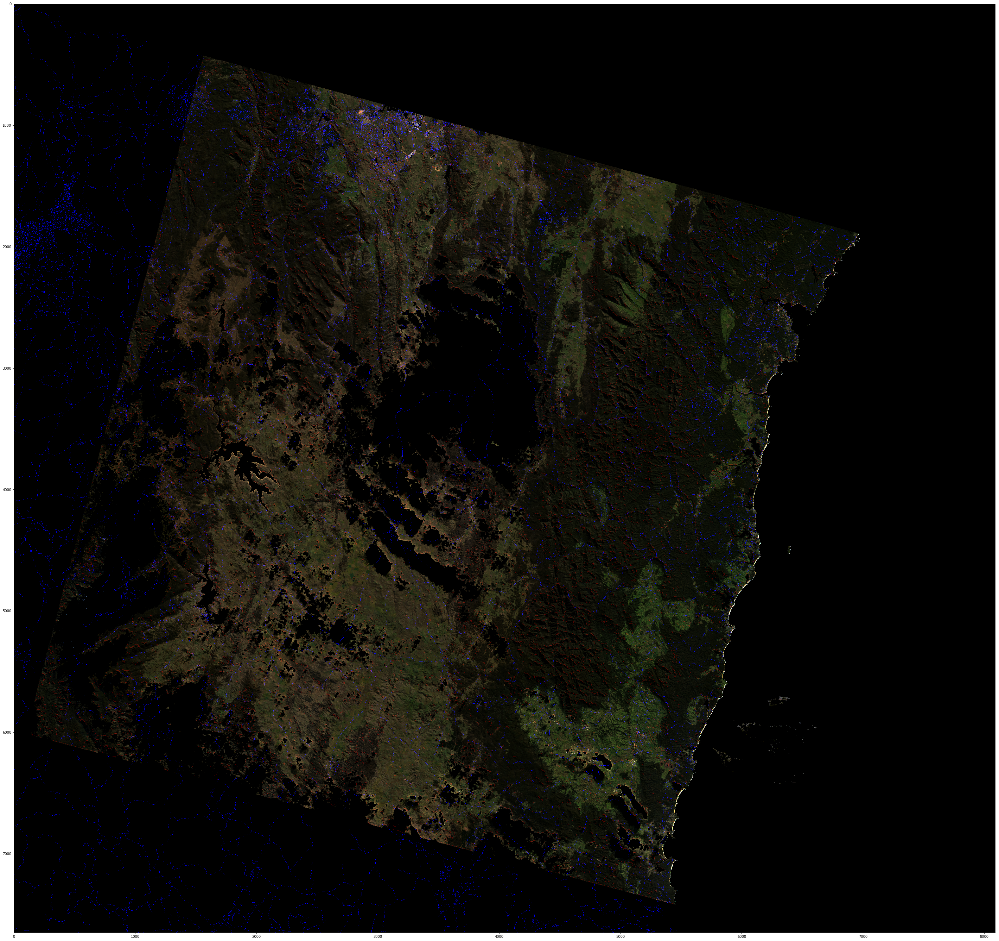

In [29]:
show_pred_prob_with_raw(train_raw_image, train_norm_log_pred, train_road_mask, pred_weight=0.3, 
                        figsize=(50,50))

CV

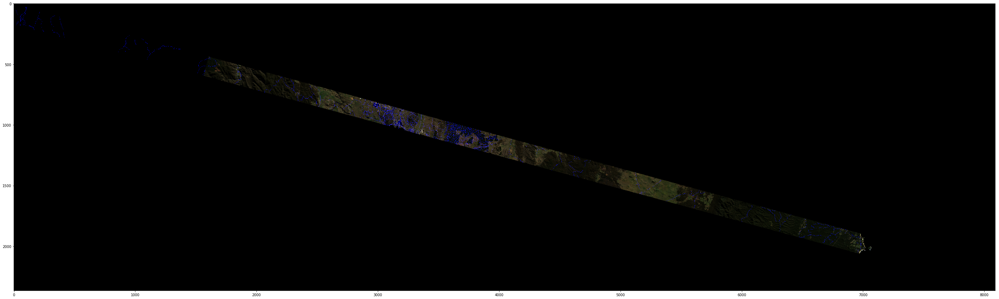

In [37]:
# pred
show_pred_prob_with_raw(CV_raw_image, CV_pred, CV_road_mask, pred_weight=0.3, figsize=(50,50))

In [32]:
# log pred
CV_log_pred = -np.log(-CV_pred + 1 + 1e-7)

print('CV_log pred: ')
print(CV_log_pred.min(), CV_log_pred.max(), CV_log_pred.mean())

CV_norm_log_pred = (CV_log_pred - CV_log_pred.min()) / (CV_log_pred.max()-CV_log_pred.min())

print('normalized log pred: ')
print(CV_norm_log_pred.min(), CV_norm_log_pred.max(), CV_norm_log_pred.mean())

CV_log pred: 
-9.999999505838704e-08 16.11809565095832 0.002530248346541866
normalized log pred: 
0.0 1.0 0.00015698804533944354


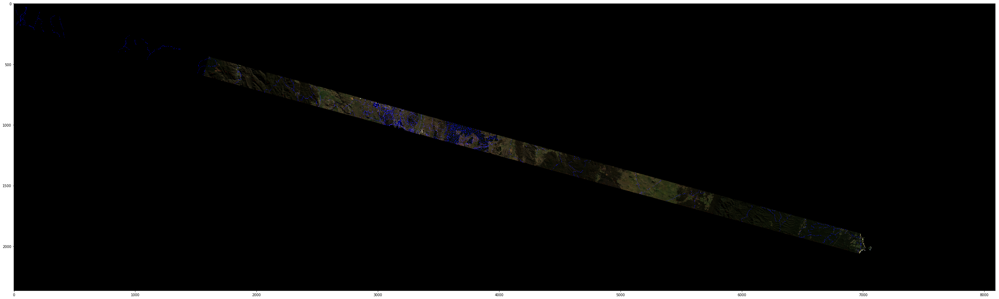

In [33]:
show_pred_prob_with_raw(CV_raw_image, CV_norm_log_pred, CV_road_mask, pred_weight=0.3, figsize=(50,50))

save plot

In [ ]:
save_path = "..."

In [ ]:
# Analyze pred in plot
show_pred_prob_with_raw(train_raw_image, train_pred_road, train_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'prob_road_on_train - 0_3.png')

show_pred_prob_with_raw(CV_raw_image, CV_pred_road, CV_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'prob_road_on_CV - 0_3.png')

In [ ]:
show_pred_prob_with_raw(CV_raw_image, CV_norm_log_pred, CV_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'log_prob_on_CV - 0_3.png')

show_pred_prob_with_raw(train_raw_image, train_norm_log_pred, train_road_mask, 
                        pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'log_prob_on_train - 0_3.png')

In [ ]:
# trial for FCN pred (one-hot encoding)
b[:,:,0] *=3
b[:,:,1] *=6
print(b)

np.exp(b)/np.array([np.sum(np.exp(b), axis=-1)]*b.shape[-1]).transpose(1,2,0)
np.exp(b)[:,:,1]/np.sum(np.exp(b), axis=-1)
b[:,:,1]/np.sum(b, axis=-1)